<a href="https://colab.research.google.com/github/Kp-hash/VANILLA-GANS/blob/main/Vanilla_ASL_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module Import
Importing the neccessary packages 

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms 
from torchvision.datasets import FashionMNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader, Dataset,random_split,TensorDataset
import matplotlib.pyplot as plt
from torchsummary import summary
# set the seed
torch.manual_seed(0)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
# Import the required packages
import torch
from torch import nn
# This is the module for download sign
from tqdm.auto import tqdm
# contains modular datasets and architectures
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader, Dataset,random_split,TensorDataset
import matplotlib.pyplot as plt
import torch.optim as optim
import torchvision.datasets as td
torch.manual_seed(0)
import os
import io
import pandas as pd
import torch.nn.functional as F
# Code to read csv file into Colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Mount google drive as working dir
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Create a function to show and plot images.

def show_tensor_images(image_tensor, num_images = 25, size=(1,28,28)):
    '''
     This is a function that plots an image: it takes the image tensor, num of images,
     and the image size(CH x H x W)
    '''
    # Detach the image from GPU and attach cpu and reshape the image (B x CH x H x W)
    image_unflat = image_tensor.detach().cpu().view(-1,*size)
    # 

    # Use the make_grid function to plot the image as a grid
    image_grid = make_grid(image_unflat[:num_images], nrow=5)

    #plt.imshow(image_grid.permute(1,2,0).squeeze())

    plt.imshow(image_grid.permute(1,2,0).squeeze())
    plt.show()



# Building the generator component

In [ ]:
# Creating the generator block
def get_generator_block(input_dim,output_dim):
    '''
     This function returns a single neuron layer of the generators network given an input
     and output dim.
     Parameters:
         input_dim: This is the dimension of the input vector, a scalar value
         output_dim: This is the dimension of the output vector, a scalar value
     returns:
         This neuron return a single neuron of the generator network after performing 
         a linear transformation, batch normalization and then apply the relu act func
    '''
     # Using the sequntial function to arrange the process
    return nn.Sequential(
        # Apply a linear transformation to the data
        nn.Linear(input_dim, output_dim),
        # Apply the batch normalization
        nn.BatchNorm1d(output_dim),
        # Apply the activation function to return (0,max(x))
        nn.ReLU(inplace=True)

     )

In [ ]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


In [ ]:
# Creating the generator class
class Generator(nn.Module):
    '''
      This is the generator class
      Values:
          z_dim: It takes the noise dimension as a sclar value
          im_dim: It takes the dimension of the images- scalar value(H x W)
          hidden_dim: This is the dimension of the hidden layers a scalar value
    '''
    def __init__(self,z_dim=10,im_dim=784,hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            # input layer of neurons
            get_generator_block(z_dim, hidden_dim),
            # imlement the hidden layer
            get_generator_block(hidden_dim, (2 * hidden_dim)),
            # another hidden layer
            get_generator_block((2*hidden_dim), (4 * hidden_dim)),
            # another hidden layer
            get_generator_block((4*hidden_dim), (8 * hidden_dim)),

            # perform a linear transoformation for the final layer
            nn.Linear((hidden_dim * 8),im_dim),
            # squeeze final output to sigmoid
            nn.Sigmoid()

        )

    # Implement the feed forward network
    def forward(self, noise):
        '''
         This is a function that takes the noise tensor and coompletes
         forward pass.
         Returns:
          This returns the generated images.
         Parameters:
          noise: This is the noise tensor with dimension (n_sample,z_dim)
        '''
        return self.gen(noise)

    # return the generator model
    def get_gen(self):
        return self.gen



In [ ]:
gen = Generator()
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=10, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
# Building the unit test
def test_generator(z_dim, im_dim, hidden_dim, num_test=1000):
    gen = Generator(z_dim,im_dim,hidden_dim).get_gen()

    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == \
    f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # confirming output shape
    assert tuple(test_output.shape) == (num_test,im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(10,10,10)
print('success')

success


In [ ]:
# create noise generator
def get_noise(n_samples,z_dim,device='cpu'):
    '''
       This is a function that creates the noise vector for the input.
       Parameters: 
           n_samples: This is the number of noise vectors to be created
           z_dim: This is the dimension of each of the noise vectors.
       Returns:
       input noise vector for the generator
    '''
    return torch.randn(n_samples,z_dim,device=device)

In [ ]:
# create the unit test for this 
def test_get_noise(n_samples,z_dim,device):
    g_noise = get_noise(n_samples,z_dim,device)

    assert tuple(g_noise.shape) == (n_samples,z_dim)
    # confirm normal distribution was used
    assert torch.abs(g_noise.std() - torch.tensor(1.0)) < 0.01
    # confirm device
    assert str(g_noise.device).startswith(device)

test_get_noise(1000,100,'cpu')
print('success')

success


# Building the Discriminator component

In [ ]:
# creating the Discriminator neuron
def get_discriminator(input_dim,output_dim,slope=0.2):
    '''
      This is a function for a single neural layer for the discriminator.
      Parameters:
          input_dim: This is the input vector dimension
          output_dim: This is the output vector dimension
      Returns:
         a discriminator layer wih linear transformation and act func leakyRelu
    '''
    return nn.Sequential(
        nn.Linear(input_dim,output_dim),
        nn.LeakyReLU(slope,inplace=True)
    )

In [ ]:
get_discriminator(4,10)

Sequential(
  (0): Linear(in_features=4, out_features=10, bias=True)
  (1): LeakyReLU(negative_slope=0.2, inplace=True)
)

In [ ]:
# Unit test for discriminator block

def test_disc_block(in_features,out_features,slope,num_sample=1000):
    disc = get_discriminator(in_features,out_features,slope)

    assert len(disc) == 2
    test_input = torch.randn(num_sample,in_features)
    test_output = disc(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_sample, out_features)

    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

    assert str(disc.__getitem__(0)).replace(' ', '') == \
    'Linear(in_features={},out_features={},bias=True)'.format(in_features,out_features)
    assert str(disc.__getitem__(1)).replace(' ', '').replace(',inplace=True', '')\
     == 'LeakyReLU(negative_slope={})'.format(slope)  

test_disc_block(25, 12,slope=0.2)
test_disc_block(15, 28,slope=0.2)
print("Success!") 


Success!


In [ ]:
get_discriminator(4,10)

Sequential(
  (0): Linear(in_features=4, out_features=10, bias=True)
  (1): LeakyReLU(negative_slope=0.2, inplace=True)
)

In [ ]:
# Creating the discriminator class

class Discriminator(nn.Module):
    '''
       Discriminator class
       Parameters;
          im_dim: Input image dimension, for image into the network
          hidden_dim: Dimension of the hidden layers
          
    '''
    def __init__(self,im_dim=784,hidden_dim=128):
        super(Discriminator,self).__init__()
        self.disc = nn.Sequential(
            # layer 1 of the network
            get_discriminator(im_dim,hidden_dim * 4),
            # Layer 2
            get_discriminator(hidden_dim * 4,hidden_dim * 2),
            # layer 3
            get_discriminator(hidden_dim * 2,hidden_dim),

            # Layer 4 - the output layer(no sigmoid act func since its included in loss)
            nn.Linear(hidden_dim, 1)

        )
    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
        image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image) 
    
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc  

In [ ]:
# unit test 
def test_discriminator(im_dim, hidden_dim, num_test=100):
    test_disc = Discriminator(im_dim,hidden_dim).get_disc()

    # check the length of the model
    assert len(test_disc) == 4
    assert type(test_disc.__getitem__(3)) == nn.Linear

    # check the linear layer s correct
    test_input = torch.randn(num_test,im_dim)
    test_output = test_disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


In [ ]:
# Create dataframe from file uploaded
test_df = pd.read_csv('gdrive/My Drive/sign_mnist_test.csv')
train_df = pd.read_csv('gdrive/My Drive/sign_mnist_train.csv')

In [ ]:
train_df.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,...,pixel745,pixel746,pixel747,pixel748,pixel749,pixel750,pixel751,pixel752,pixel753,pixel754,pixel755,pixel756,pixel757,pixel758,pixel759,pixel760,pixel761,pixel762,pixel763,pixel764,pixel765,pixel766,pixel767,pixel768,pixel769,pixel770,pixel771,pixel772,pixel773,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3,107,118,127,134,139,143,146,150,153,156,158,160,163,165,159,166,168,170,170,171,171,171,172,171,171,170,170,169,111,121,129,135,141,144,148,151,154,157,160,...,205,206,206,207,207,206,206,204,205,204,203,202,142,151,160,172,196,188,188,190,135,96,86,77,77,79,176,205,207,207,207,207,207,207,206,206,206,204,203,202
1,6,155,157,156,156,156,157,156,158,158,157,158,156,154,154,153,152,151,149,149,148,147,146,144,142,143,138,92,108,158,159,159,159,160,160,160,160,160,160,160,...,100,78,120,157,168,107,99,121,133,97,95,120,135,116,95,79,69,86,139,173,200,185,175,198,124,118,94,140,133,84,69,149,128,87,94,163,175,103,135,149
2,2,187,188,188,187,187,186,187,188,187,186,185,185,185,184,184,184,181,181,179,179,179,178,178,109,52,66,77,83,188,189,189,188,188,189,188,188,188,188,187,...,203,204,203,201,200,200,199,198,196,195,194,193,198,166,132,114,89,74,79,77,74,78,132,188,210,209,206,205,204,203,202,201,200,199,198,199,198,195,194,195
3,2,211,211,212,212,211,210,211,210,210,211,209,207,208,207,206,203,202,201,200,198,197,195,192,197,171,51,52,54,212,213,215,215,212,212,213,212,212,211,211,...,247,242,233,231,230,229,227,225,223,221,220,216,58,51,49,50,57,60,17,15,18,17,19,1,159,255,237,239,237,236,235,234,233,231,230,226,225,222,229,163
4,13,164,167,170,172,176,179,180,184,185,186,188,189,189,190,191,189,190,190,187,190,192,193,191,191,192,192,194,194,166,169,172,174,177,180,182,185,186,187,190,...,90,77,88,117,123,127,129,134,145,152,156,179,105,106,105,104,104,104,175,199,178,152,136,130,136,150,118,92,85,76,92,105,105,108,133,163,157,163,164,179


In [ ]:
class AslDataset(Dataset):
    '''
        This is a class that inherits from the Dataset Module in Pytorch.
        Parameters:
            train_df: This is the training dataset.
            test_df: This is the test dataset.
        Attributes:
            train_images: This attribute returns the tensor of the training images
            train_images: This attribute returns the tensor of the test images
            train_labels: Ths returns the tensor of the training labels
            test_labels: Ths returns the tensor of the test labels
            n_train_samples: This returns the total number of training samples
            n_test_samples: This returns the total number of test samples


        returns:
            - This class takes in the training and test set of the ASL data and splits
            it into the train/test set and the train/test labels.
            - It can also return the indexed data using the __getitem__ method
            - It returns the lenght of the samples using __len__ method
    '''

    def __init__(self,images,transform=None):
        # Loading the data
        self.images = images
        self.transform = transform
        self.train_images = images.iloc[:, 1:].values.astype(float)
        if self.transform:
            self.train_images = self.transform(self.train_images)
        self.train_labels = torch.from_numpy(images.iloc[:, 0].to_numpy())
        self.full_train = TensorDataset(self.train_images.permute(1,0,2), self.train_labels) 
        self.len = self.train_images.shape[0]


    def __getitem__(self,index):
        # Gets index of data
        img_name = self.images.iloc[index,1:].values
        img_name=img_name.astype(float)
        img_name = img_name.reshape(28,28,-1)
        y = self.images.iloc[index,0]
        if self.transform:
            img_name = self.transform(img_name)
        
        return img_name,y

    def __len__(self):
        # return length of test and train samples
        return self.len



In [ ]:
dataset_temp = AslDataset(train_df,transforms.ToTensor())


In [ ]:
image=dataset_temp[0][0]
y=dataset[0][1]

In [ ]:
img = dataset_temp[0][0]
image = img.reshape(28,28)
plt.imshow(image,cmap='gray');

In [ ]:
image.shape

torch.Size([1, 28, 28])

In [ ]:
# Collect or append all the images in one empty list

train_imgs = torch.stack([train_imgs_t for train_imgs_t,_ in dataset_temp],dim = 3) 

In [ ]:
train_imgs.shape

torch.Size([1, 28, 28, 27455])

In [ ]:
# 3,32,32,50000 -> 3,32*32*50000 -> mean

train_imgs.view(1,-1).mean(dim = 1)     

tensor([159.2910], dtype=torch.float64)

In [ ]:
# 3,32,32,50000 -> 3,32*32*50000 ->std

train_imgs.view(1,-1).std(dim = 1)      

tensor([48.7695], dtype=torch.float64)

In [ ]:
data_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean = [159.2910], std = [48.7695])
])

In [ ]:
#data_transforms
dataset = AslDataset(train_df,data_transforms)

In [ ]:
help(show_tensor_images)

Help on function show_tensor_images in module __main__:

show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28))
    This is a function that plots an image: it takes the image tensor, num of images,
    and the image size(CH x H x W)



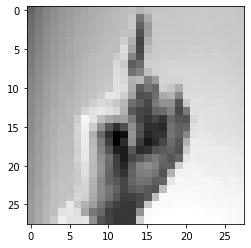

In [ ]:
img = dataset[0][0]
image = img.reshape(28,28)
plt.imshow(image,cmap='gray');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


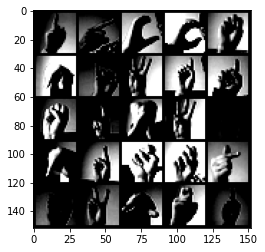

In [ ]:
show_tensor_images(dataset.train_images)

In [ ]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
dataloader = DataLoader(
    dataset.full_train,
    batch_size=batch_size,
    shuffle=True)

# Training

In [ ]:
# Initializing the generator, discriminator and the optimizer
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

# Creating Loss function

In [ ]:
help(get_noise)

Help on function get_noise in module __main__:

get_noise(n_samples, z_dim, device='cpu')
    This is a function that creates the noise vector for the input.
    Parameters: 
        n_samples: This is the number of noise vectors to be created
        z_dim: This is the dimension of each of the noise vectors.
    Returns:
    input noise vector for the generator



In [ ]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [ ]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)
        real = real.to(torch.float)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


## Generator Loss

In [ ]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [ ]:
def test_gen_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


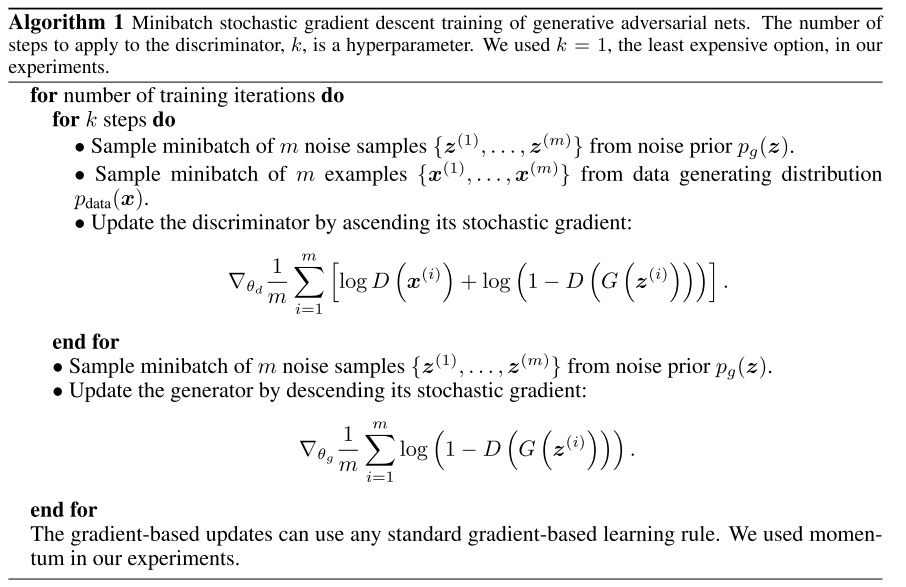

Step 500: Generator loss: 1.0357888081073765, discriminator loss: 0.4559899157881732


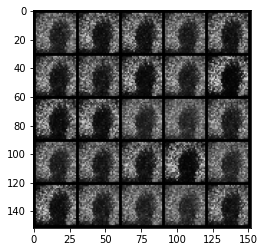

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


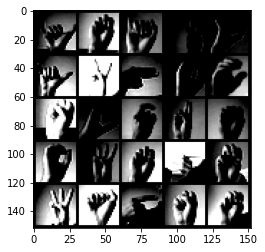

Step 1000: Generator loss: 1.2375456399917604, discriminator loss: 0.27163532587885875


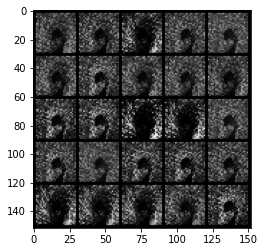

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


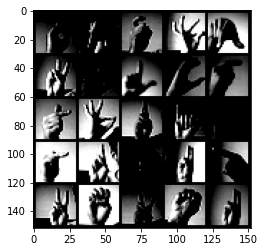

Step 1500: Generator loss: 1.518981788873673, discriminator loss: 0.18786073434352862


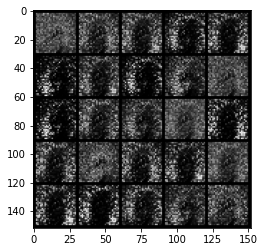

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


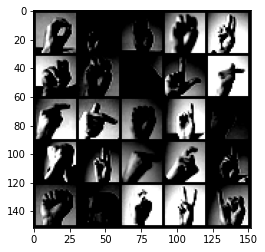

Step 2000: Generator loss: 1.8786280579566959, discriminator loss: 0.13702614843845373


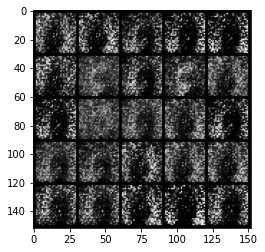

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


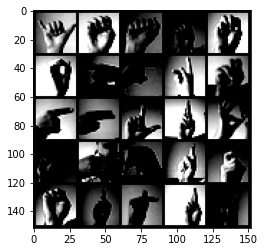

Step 2500: Generator loss: 2.4414880290031435, discriminator loss: 0.08037517622858292


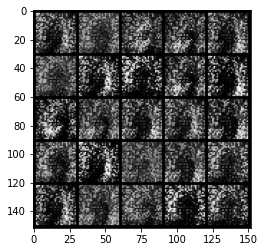

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


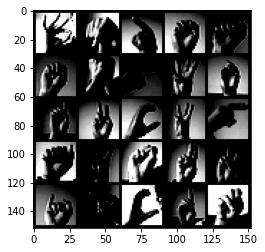

Step 3000: Generator loss: 2.9420021839141843, discriminator loss: 0.05377437101304529


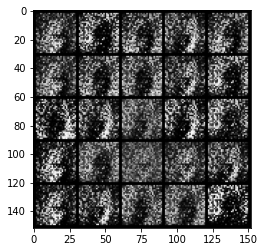

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


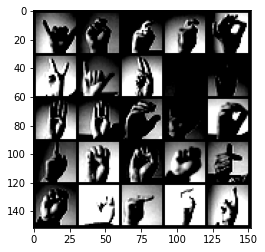

Step 3500: Generator loss: 3.4603685479164117, discriminator loss: 0.03564395513385535


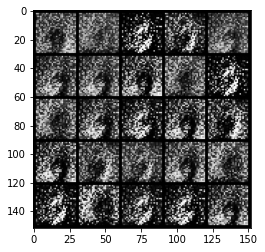

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


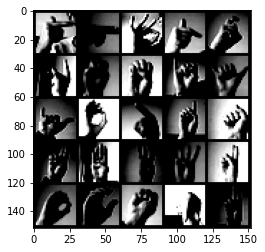

Step 4000: Generator loss: 3.8245500898361238, discriminator loss: 0.02664229886978866


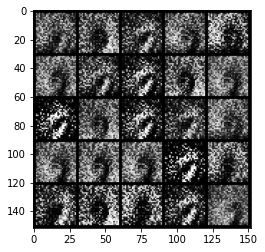

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


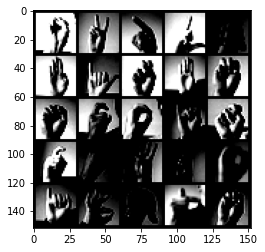

Step 4500: Generator loss: 4.120509729385379, discriminator loss: 0.020044590785168088


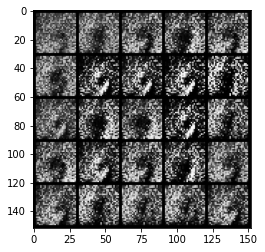

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


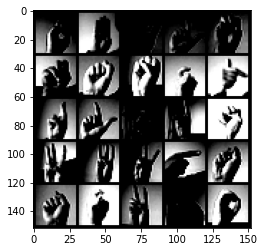

Step 5000: Generator loss: 4.524301542282102, discriminator loss: 0.014415859864093359


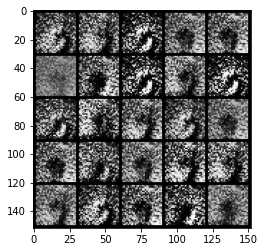

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


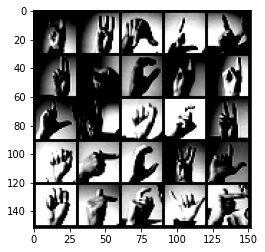

Step 5500: Generator loss: 4.826256757736203, discriminator loss: 0.011495337198488404


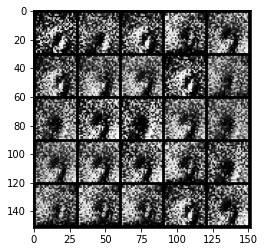

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


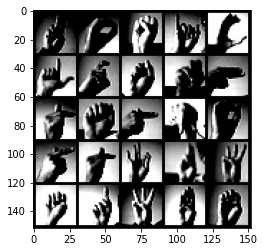

Step 6000: Generator loss: 5.014031265258791, discriminator loss: 0.010086095946840942


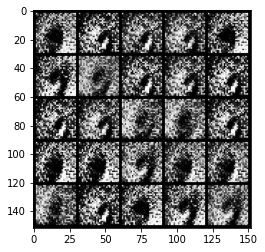

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


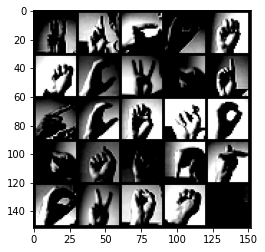

Step 6500: Generator loss: 5.20324138069153, discriminator loss: 0.00939680841658264


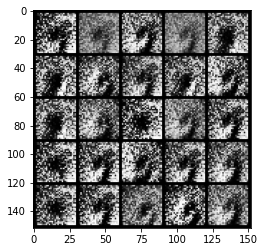

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


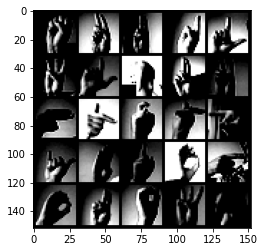

Step 7000: Generator loss: 5.465648510932925, discriminator loss: 0.008798490935005248


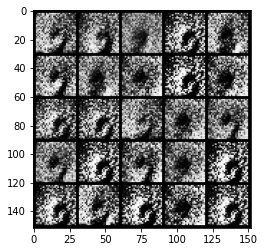

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


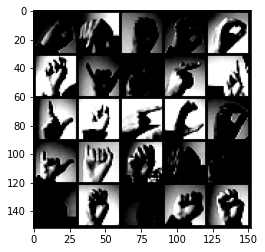

Step 7500: Generator loss: 5.417596875190734, discriminator loss: 0.007976178503595286


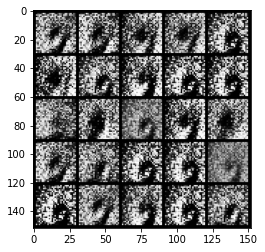

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


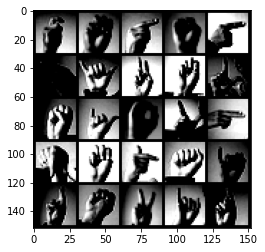

Step 8000: Generator loss: 5.6307408409118676, discriminator loss: 0.007254866077331822


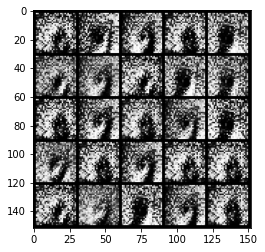

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


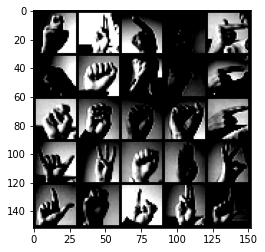

Step 8500: Generator loss: 5.874264967918395, discriminator loss: 0.006101540226489308


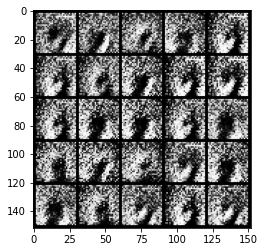

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


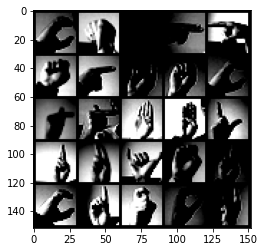

Step 9000: Generator loss: 5.836831467628472, discriminator loss: 0.0065790973777184215


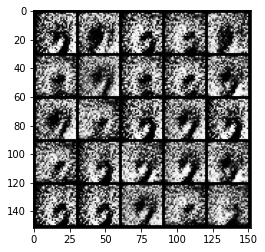

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


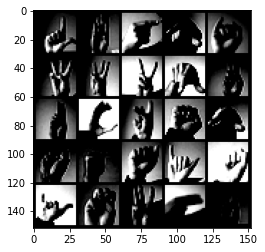

Step 9500: Generator loss: 6.244004437446589, discriminator loss: 0.005852745507610959


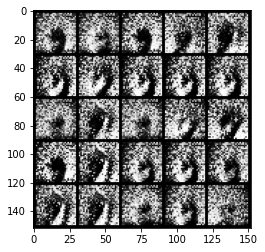

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


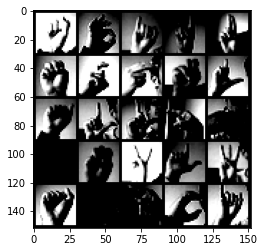

Step 10000: Generator loss: 5.943373160362238, discriminator loss: 0.00600095349340699


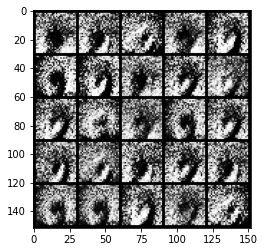

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


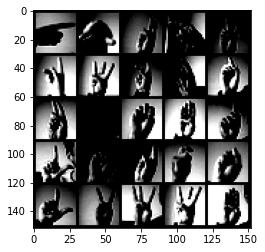

Step 10500: Generator loss: 6.047830513954166, discriminator loss: 0.006048975212383077


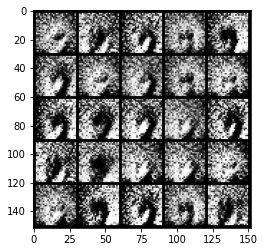

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


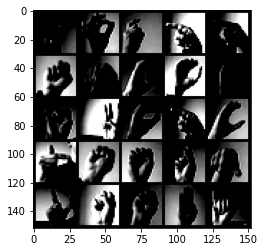

Step 11000: Generator loss: 6.06207287883758, discriminator loss: 0.0062534635392948925


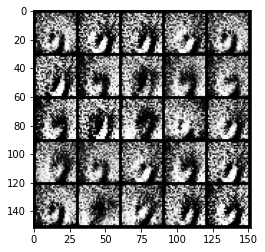

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


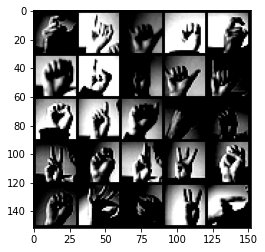

Step 11500: Generator loss: 6.086660002708439, discriminator loss: 0.006847978539532053


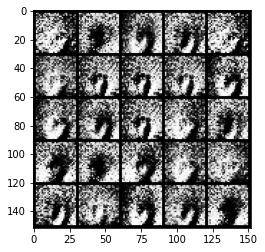

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


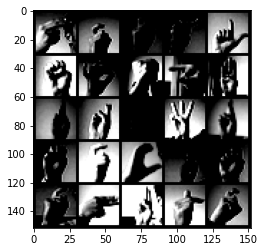

Step 12000: Generator loss: 6.137222190856933, discriminator loss: 0.006664480629493482


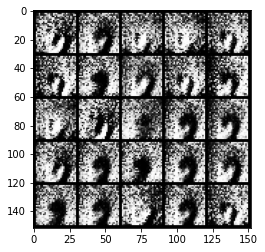

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


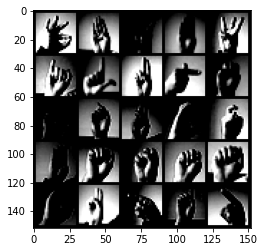

Step 12500: Generator loss: 6.209574437141417, discriminator loss: 0.006114347997936424


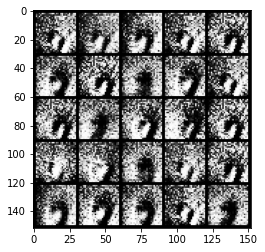

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


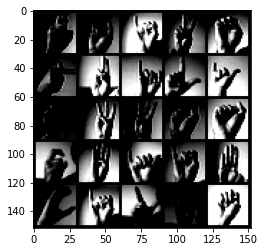

Step 13000: Generator loss: 6.175198647499088, discriminator loss: 0.005552109512733298


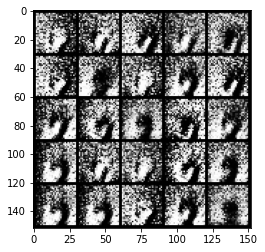

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


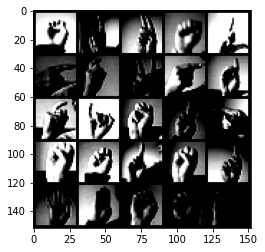

Step 13500: Generator loss: 6.28990165519714, discriminator loss: 0.00579240287467837


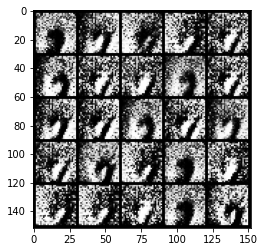

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


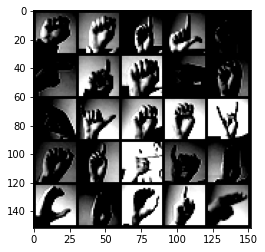

Step 14000: Generator loss: 6.326277915954591, discriminator loss: 0.005021922669082419


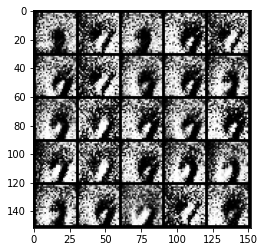

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


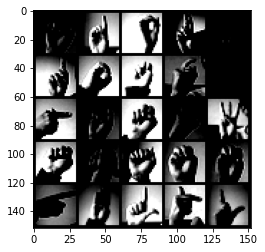

Step 14500: Generator loss: 6.5668476009368915, discriminator loss: 0.004817000567214559


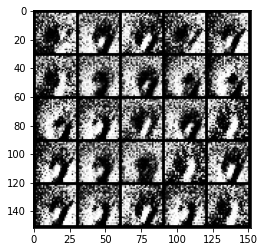

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


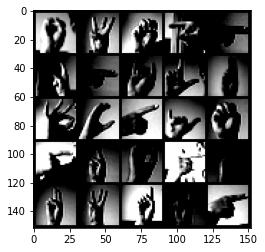

Step 15000: Generator loss: 6.374595431327813, discriminator loss: 0.005322086883708834


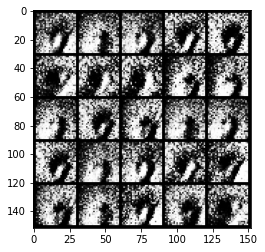

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


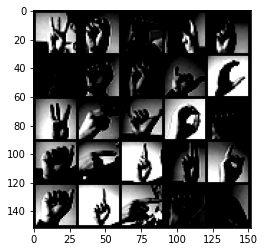

Step 15500: Generator loss: 6.264367566108701, discriminator loss: 0.005485788083635269


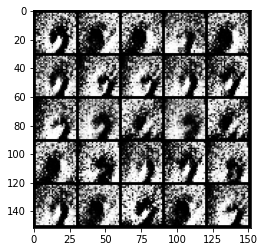

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


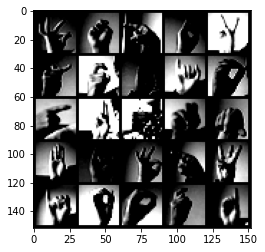

Step 16000: Generator loss: 6.341143190383915, discriminator loss: 0.005770998548774511


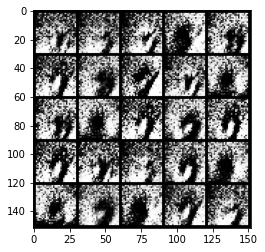

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


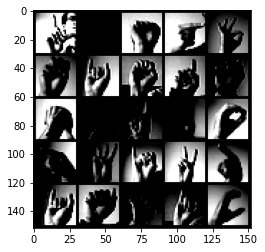

Step 16500: Generator loss: 6.263897216796876, discriminator loss: 0.006577193771896421


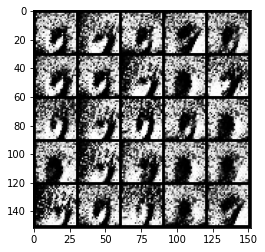

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


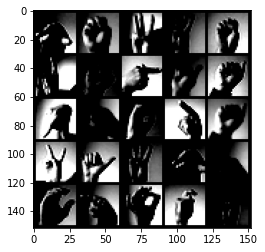

Step 17000: Generator loss: 6.4003350238800065, discriminator loss: 0.005911891314492101


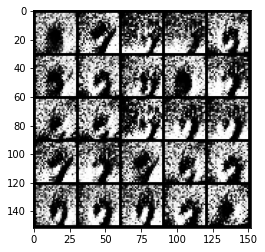

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


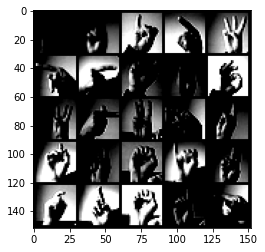

Step 17500: Generator loss: 6.47033535957337, discriminator loss: 0.005601433527015621


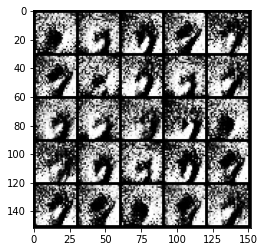

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


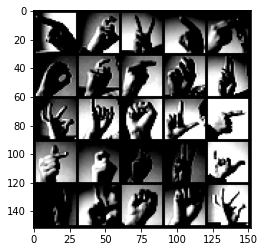

Step 18000: Generator loss: 6.593941387176514, discriminator loss: 0.005773545605887195


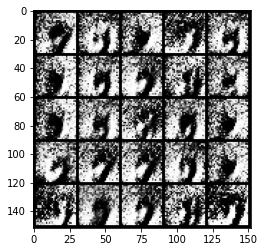

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


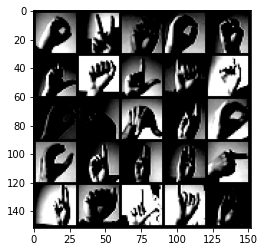

Step 18500: Generator loss: 6.458938073158263, discriminator loss: 0.0054809773594606676


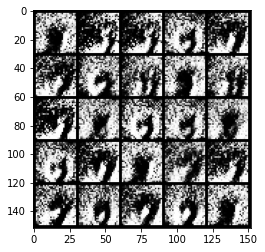

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


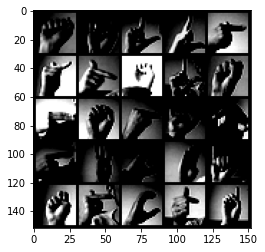

Step 19000: Generator loss: 6.613650317192072, discriminator loss: 0.005630616364302114


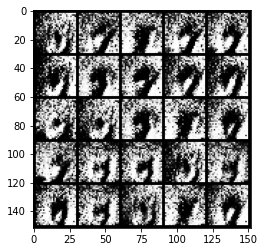

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


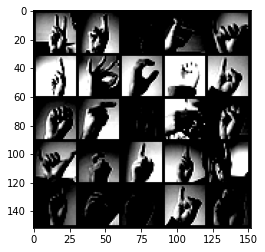

Step 19500: Generator loss: 6.70892805957793, discriminator loss: 0.005680521422284076


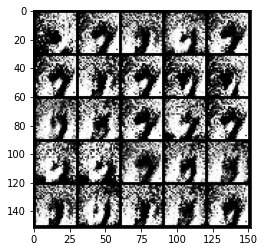

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


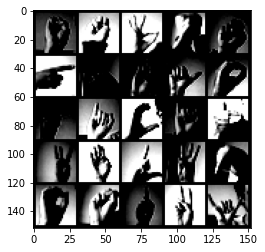

Step 20000: Generator loss: 6.610948882102967, discriminator loss: 0.005376514172006863


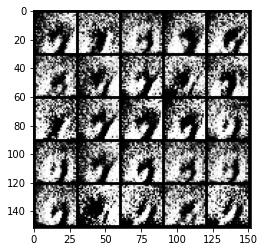

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


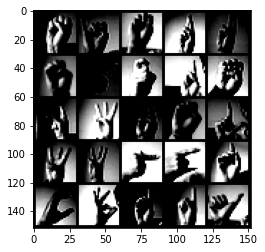

Step 20500: Generator loss: 6.723405673980711, discriminator loss: 0.00518118317821063


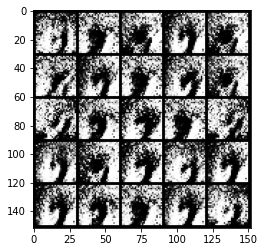

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


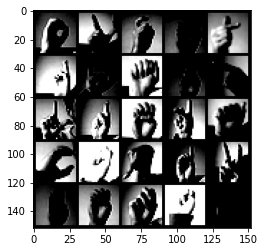

Step 21000: Generator loss: 6.65041964626312, discriminator loss: 0.005393923549097962


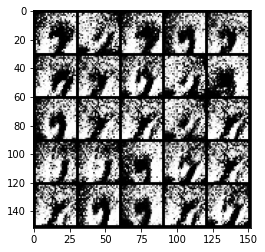

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


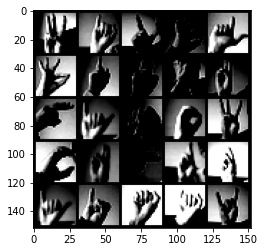

Step 21500: Generator loss: 6.666667641639724, discriminator loss: 0.004651384763186793


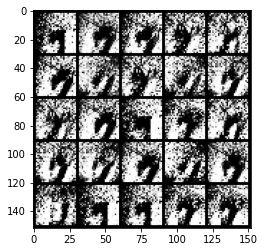

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


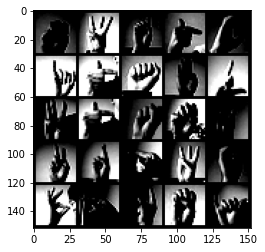

Step 22000: Generator loss: 6.798379107475278, discriminator loss: 0.0042736800280254094


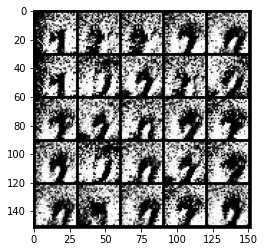

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


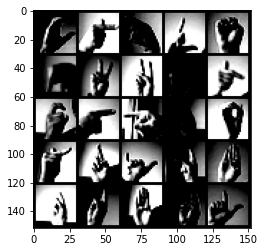

Step 22500: Generator loss: 6.889017407417303, discriminator loss: 0.004006476246140662


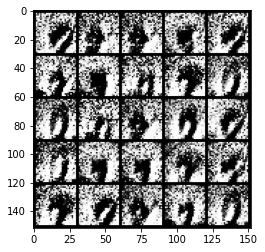

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


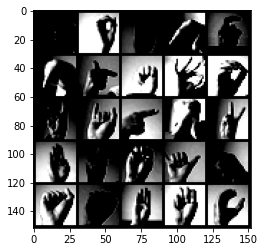

Step 23000: Generator loss: 6.837637742996217, discriminator loss: 0.0047887886284734135


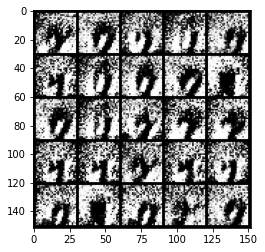

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


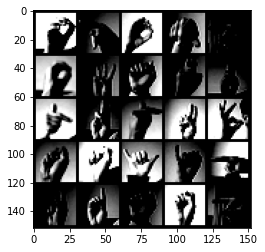

Step 23500: Generator loss: 7.01744410800934, discriminator loss: 0.0045638713115186


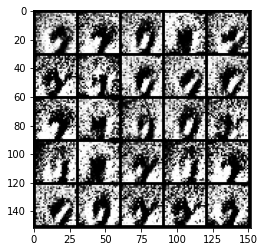

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


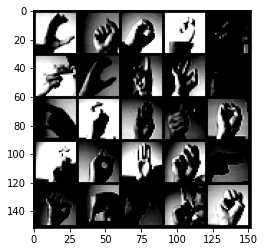

Step 24000: Generator loss: 6.8936860074996975, discriminator loss: 0.004331480033579286


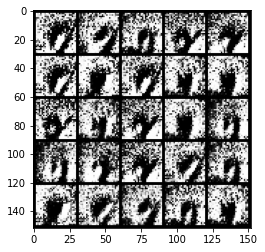

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


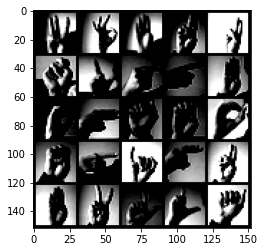

Step 24500: Generator loss: 6.902333439826968, discriminator loss: 0.0046755876453680725


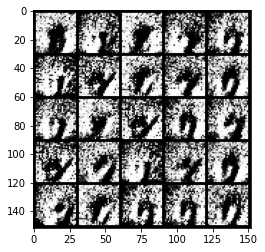

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


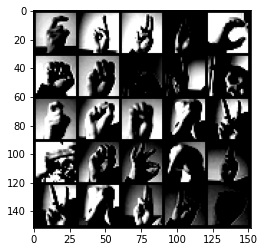

Step 25000: Generator loss: 6.919873004913335, discriminator loss: 0.004310239114536669


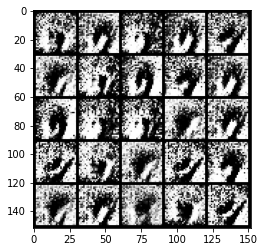

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


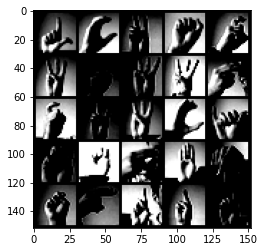

Step 25500: Generator loss: 6.88872957229614, discriminator loss: 0.0043325165093119735


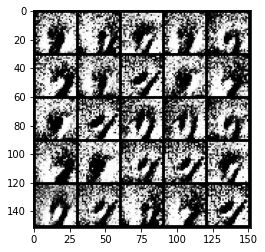

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


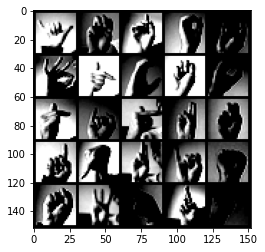

Step 26000: Generator loss: 6.994082745552061, discriminator loss: 0.004921970380688436


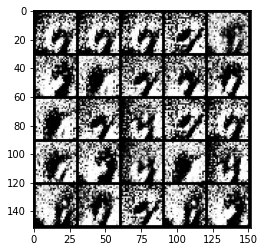

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


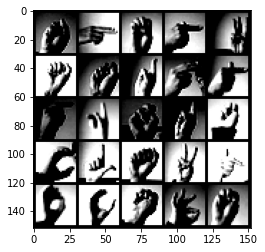

Step 26500: Generator loss: 6.945542047500609, discriminator loss: 0.005364278659242693


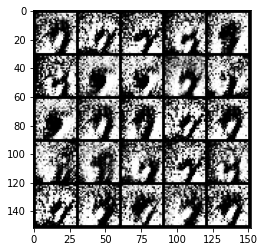

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


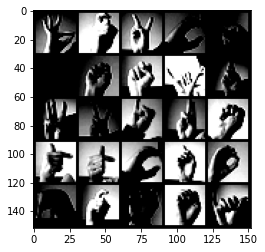

Step 27000: Generator loss: 6.875000032424922, discriminator loss: 0.004201695565774571


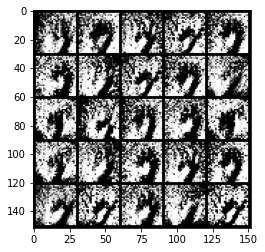

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


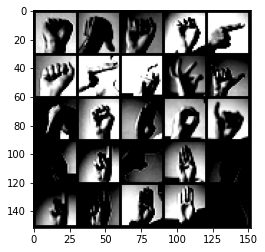

Step 27500: Generator loss: 7.176097045898444, discriminator loss: 0.0042079790754651165


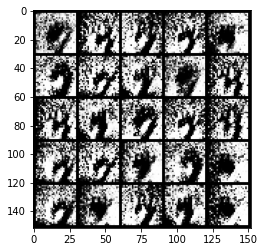

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


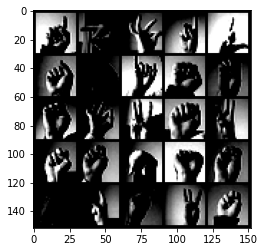

Step 28000: Generator loss: 7.153574422836302, discriminator loss: 0.004695501188936758


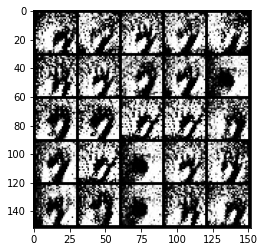

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


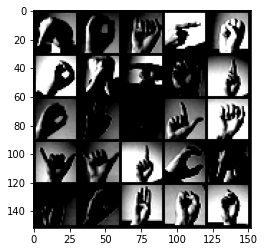

Step 28500: Generator loss: 7.328292988777162, discriminator loss: 0.004444300597286203


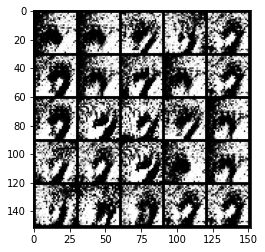

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


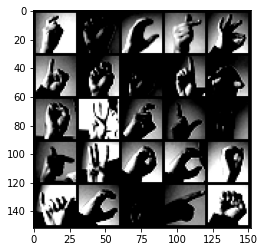

Step 29000: Generator loss: 7.192423514366145, discriminator loss: 0.004124043260104373


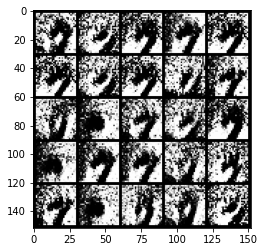

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


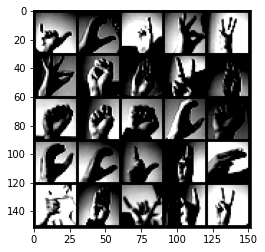

Step 29500: Generator loss: 7.271208722114564, discriminator loss: 0.0032563156561445776


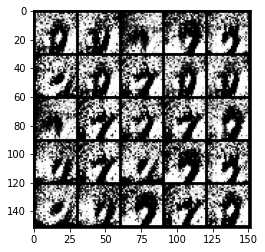

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


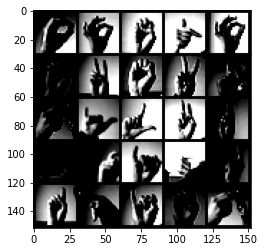

Step 30000: Generator loss: 7.209803232192992, discriminator loss: 0.003465517238480971


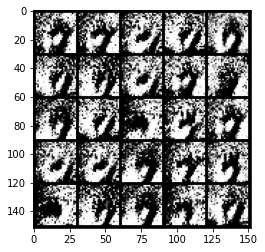

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


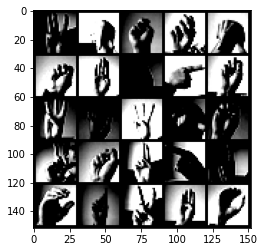

Step 30500: Generator loss: 7.242583636283876, discriminator loss: 0.0031171938026891464


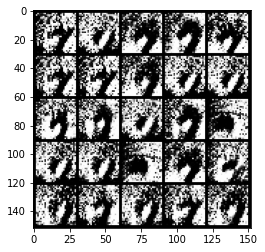

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


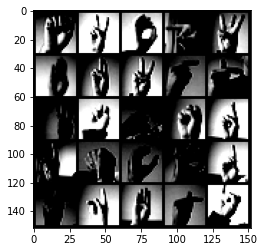

Step 31000: Generator loss: 7.516545446395875, discriminator loss: 0.0028261887894877862


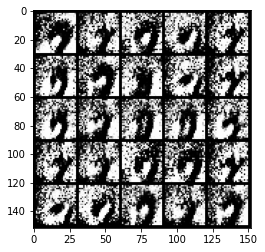

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


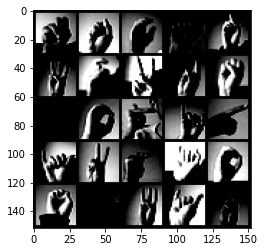

Step 31500: Generator loss: 7.683527678489689, discriminator loss: 0.0026504312451215793


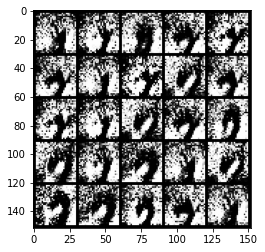

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


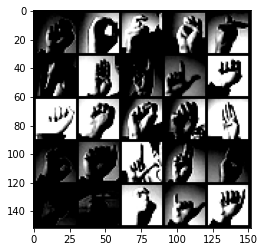

Step 32000: Generator loss: 7.656519174575818, discriminator loss: 0.0025409683216857932


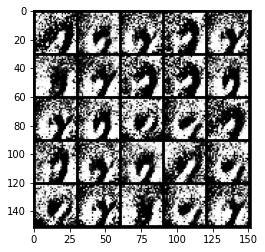

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


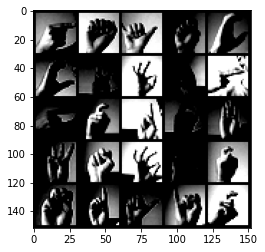

Step 32500: Generator loss: 7.655060193061826, discriminator loss: 0.002530653730678753


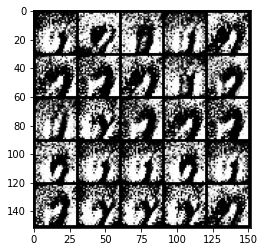

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


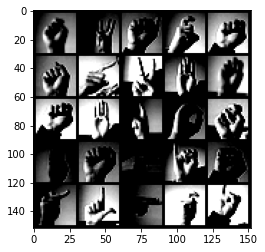

Step 33000: Generator loss: 7.744701567649835, discriminator loss: 0.0022911802914386457


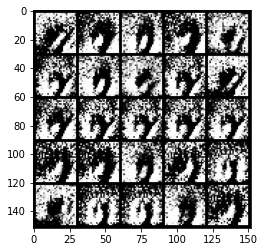

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


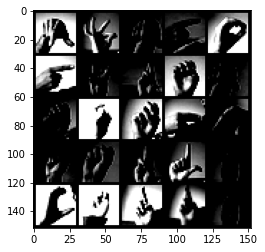

Step 33500: Generator loss: 7.941042211532594, discriminator loss: 0.0022915927588674097


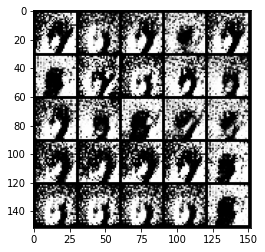

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


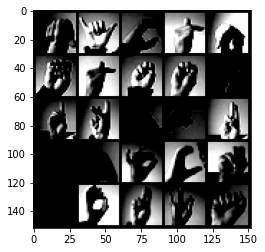

Step 34000: Generator loss: 7.9657166881561245, discriminator loss: 0.0027663154258898417


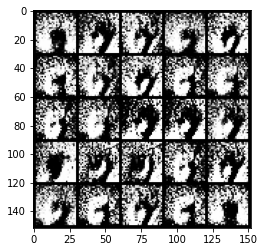

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


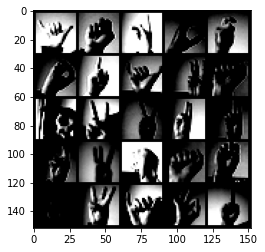

Step 34500: Generator loss: 7.635118337631215, discriminator loss: 0.002354319259335171


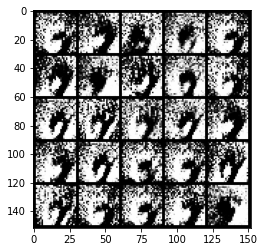

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


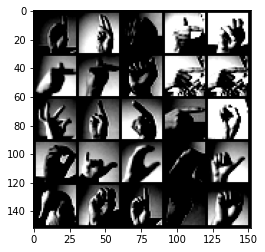

Step 35000: Generator loss: 7.92463654994965, discriminator loss: 0.002428893205316852


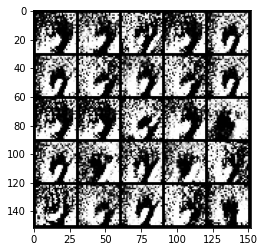

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


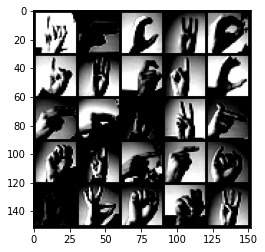

Step 35500: Generator loss: 8.026822397232062, discriminator loss: 0.0019962522199239185


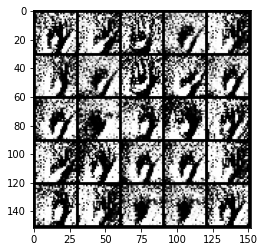

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


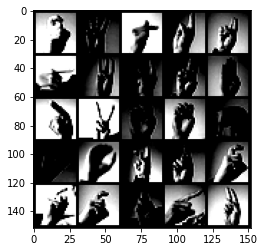

Step 36000: Generator loss: 7.979199078559871, discriminator loss: 0.0018299906685351754


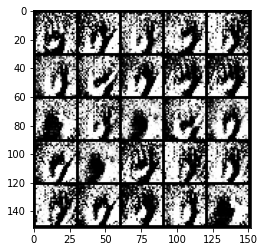

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


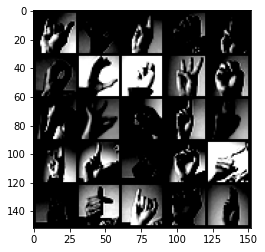

Step 36500: Generator loss: 8.103268923759462, discriminator loss: 0.002267405032727766


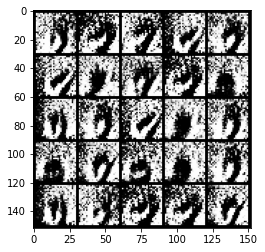

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


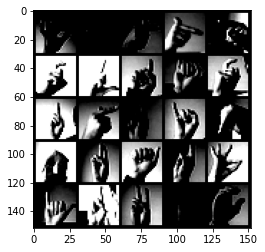

Step 37000: Generator loss: 7.941556853294376, discriminator loss: 0.0024595217814494417


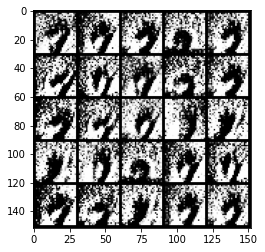

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


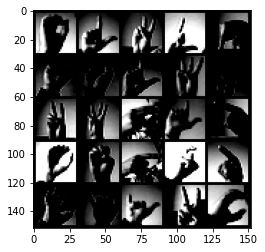

Step 37500: Generator loss: 8.023651772499084, discriminator loss: 0.0022952909579762493


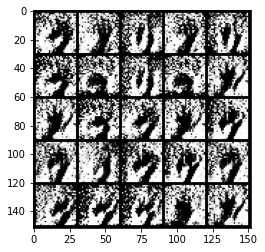

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


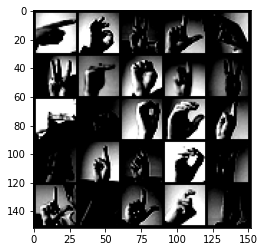

Step 38000: Generator loss: 8.092536121368413, discriminator loss: 0.0022762259379742323


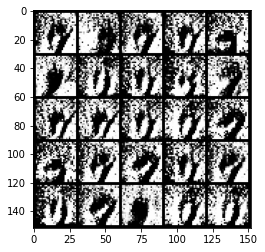

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


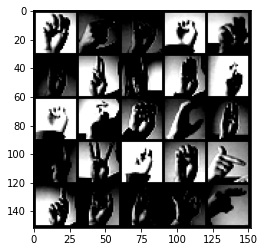

Step 38500: Generator loss: 8.3172909784317, discriminator loss: 0.002170114721913706


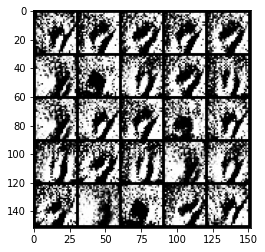

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


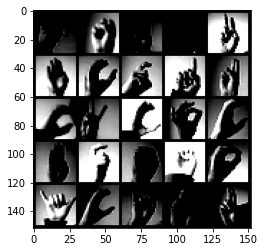

Step 39000: Generator loss: 8.047250325202949, discriminator loss: 0.002092299639956764


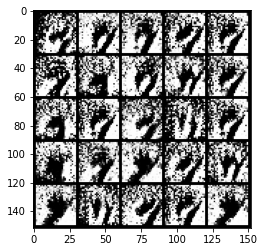

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


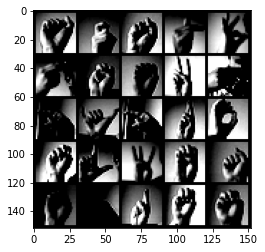

Step 39500: Generator loss: 7.996598671913144, discriminator loss: 0.0017549558482642179


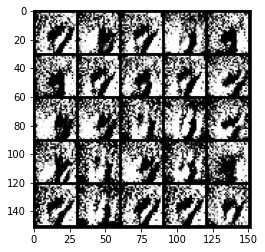

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


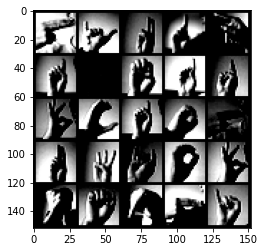

Step 40000: Generator loss: 7.9630669660568145, discriminator loss: 0.002123527857729641


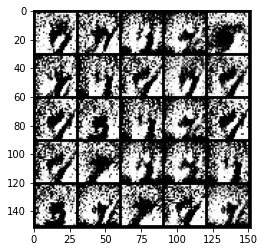

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


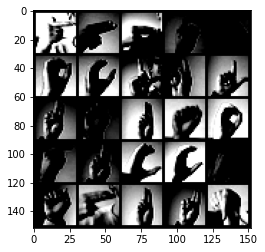

Step 40500: Generator loss: 7.894180604934688, discriminator loss: 0.0020085698774164494


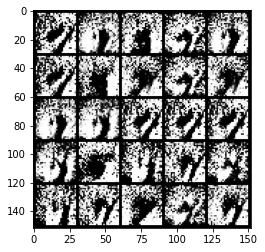

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


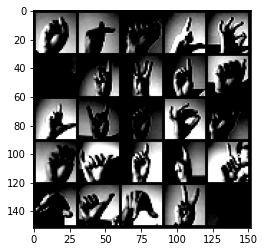

Step 41000: Generator loss: 8.117092739105217, discriminator loss: 0.001749346668777435


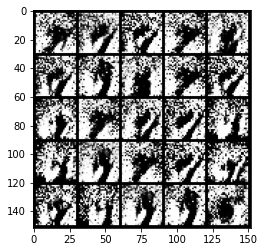

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


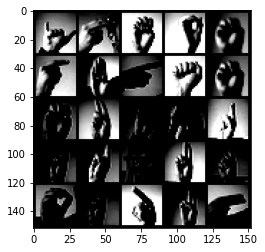

Step 41500: Generator loss: 8.203459319114689, discriminator loss: 0.001752437747833028


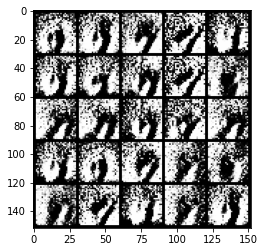

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


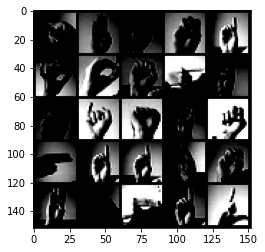

Step 42000: Generator loss: 7.8241826896667455, discriminator loss: 0.002122440557432129


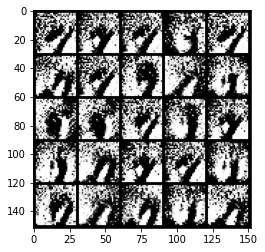

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


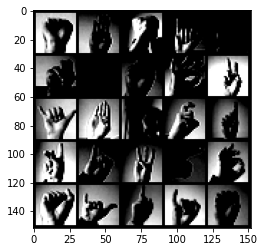

Step 42500: Generator loss: 7.824898954391482, discriminator loss: 0.00161159692927322


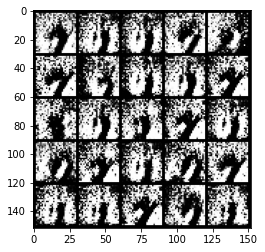

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


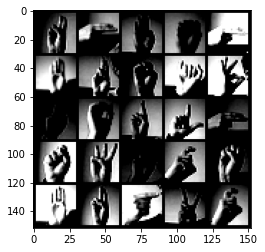

In [ ]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)
        real = real.to(torch.float)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1